# Modelo Analítico: Flujo 2D Viscoso con Transferencia de Calor y Placa Móvil

## 1. Hipótesis
- Flujo **incompresible** ($\nabla \cdot \mathbf{u} = 0$) y **laminar**.
- Dominio **bidimensional** (variaciones en $x$ y $y$).
- Placa inferior ($y = 0$) se mueve con velocidad $-U_p \hat{i}$ (sentido $-x$).
- Gradiente de presión constante en $x$: $\frac{\partial p}{\partial x} = \text{const.}$
- Efectos gravitacionales despreciables.

## 2. Ecuaciones Gobernantes

### Conservación de Momento (Navier-Stokes 2D)
**Componente $x$**:
$$
\frac{\partial u}{\partial t} + u \frac{\partial u}{\partial x} + v \frac{\partial u}{\partial y} = -\frac{1}{\rho} \frac{\partial p}{\partial x} + \nu \left( \frac{\partial^2 u}{\partial x^2} + \frac{\partial^2 u}{\partial y^2} \right)
$$

**Componente $y$**:
$$
\frac{\partial v}{\partial t} + u \frac{\partial v}{\partial x} + v \frac{\partial v}{\partial y} = -\frac{1}{\rho} \frac{\partial p}{\partial y} + \nu \left( \frac{\partial^2 v}{\partial x^2} + \frac{\partial^2 v}{\partial y^2} \right)
$$

donde:
- $u$, $v$: Componentes de velocidad en $x$ e $y$.
- $\nu = \mu/\rho$: Viscosidad cinemática.

### Conservación de Energía
$$
\frac{\partial T}{\partial t} + u \frac{\partial T}{\partial x} + v \frac{\partial T}{\partial y} = \alpha \left( \frac{\partial^2 T}{\partial x^2} + \frac{\partial^2 T}{\partial y^2} \right) + \frac{\Phi}{\rho c_p}
$$

**Disipación viscosa ($\Phi$)**:
$$
\Phi = \mu \left[ 2 \left( \frac{\partial u}{\partial x} \right)^2 + 2 \left( \frac{\partial v}{\partial y} \right)^2 + \left( \frac{\partial u}{\partial y} + \frac{\partial v}{\partial x} \right)^2 \right]
$$

### Esfuerzo Cortante ($\tau_{xy}$)
$$
\tau_{xy} = \mu \left( \frac{\partial u}{\partial y} + \frac{\partial v}{\partial x} \right)
$$

## 3. Condiciones de Frontera

| **Variable**   | **Placa Inferior ($y=0$)**       | **Superior ($y=H$)**       |
|----------------|----------------------------------|----------------------------|
| Velocidad $u$  | $u = -U_p$                       | $u = U_0$                  |
| Velocidad $v$  | $v = 0$ (no penetración)         | $v = 0$                    |
| Temperatura $T$| $T = T_0$                        | $T = T_1$                  |

## 4. Simplificaciones para Estado Estacionario
Si $\frac{\partial}{\partial t} = 0$ y $\frac{\partial p}{\partial x} = -\Delta p/L$:
$$
\nu \frac{d^2 u}{dy^2} = \frac{1}{\rho} \frac{\Delta p}{L}, \quad \text{con} \quad u(0) = -U_p, \quad u(H) = U_0
$$

**Solución analítica** para $u(y)$:
$$
u(y) = \frac{\Delta p}{2 \mu L} y (y - H) + \left(U_0 + U_p \frac{y}{H}\right) - U_p

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

In [35]:
# PARAMETROS DEL PROBLEMA
# Geometría
Lx, Ly = 2.0, 1.0  # Dimensiones del dominio (x, y)
nx, ny = 50, 50      # Número de puntos en la malla
dx, dy = Lx/(nx-1), Ly/(ny-1)

# Propiedades del fluido
rho = 1.0            # Densidad
mu = 0.1             # Viscosidad dinámica
nu = mu / rho        # Viscosidad cinemática
alpha = 0.01         # Difusividad térmica
cp = 1.0             # Calor específico

# Condiciones de frontera
U_p = -1.0           # Velocidad de la placa (sentido contrario)
U_0 = 2.0            # Velocidad del flujo libre
T0, T1 = 0.0, 1.0    # Temperaturas de la placa y del fluido

# Tiempo
dt = 0.001           # Paso de tiempo
nt = 500             # Número de pasos de tiempo

## INICIALIZACIÓN

# Mallas
x = np.linspace(0, Lx, nx)
y = np.linspace(0, Ly, ny)
X, Y = np.meshgrid(x, y)

# Campos iniciales
u = np.zeros((ny, nx)) + U_0  # Velocidad horizontal
v = np.zeros((ny, nx))         # Velocidad vertical
T = np.zeros((ny, nx)) + T1    # Temperatura
p = np.zeros((ny, nx))         # Presión

# Aplicar condiciones de frontera
u[0, :] = U_p     # Placa inferior móvil
u[-1, :] = U_0    # Flujo libre superior
T[0, :] = T0      # Temperatura de la placa
T[-1, :] = T1     # Temperatura del fluido lejos de la 

# EVOLUCIÓN TEMPORAL (ESQUEMA EXPLICITO)
for n in range(nt):
    # Copiar campos anteriores
    u_old = u.copy()
    v_old = v.copy()
    T_old = T.copy()

    # Resolver Navier-Stokes (simplificado)
    for i in range(1, ny-1):
        for j in range(1, nx-1):
            # Ecuación de u (componente x)
            u[i, j] = (u_old[i, j] + dt * (
                -u_old[i, j] * (u_old[i, j+1] - u_old[i, j-1]) / (2*dx)
                -v_old[i, j] * (u_old[i+1, j] - u_old[i-1, j]) / (2*dy)
                + nu * (
                    (u_old[i, j+1] - 2*u_old[i, j] + u_old[i, j-1]) / dx**2
                    + (u_old[i+1, j] - 2*u_old[i, j] + u_old[i-1, j]) / dy**2
                )
            ))

            # Ecuación de T (temperatura)
            T[i, j] = (T_old[i, j] + dt * (
                -u_old[i, j] * (T_old[i, j+1] - T_old[i, j-1]) / (2*dx)
                -v_old[i, j] * (T_old[i+1, j] - T_old[i-1, j]) / (2*dy)
                + alpha * (
                    (T_old[i, j+1] - 2*T_old[i, j] + T_old[i, j-1]) / dx**2
                    + (T_old[i+1, j] - 2*T_old[i, j] + T_old[i-1, j]) / dy**2
                )
                + (mu / (rho * cp)) * (  # Disipación viscosa (simplificada)
                    2 * ((u_old[i, j+1] - u_old[i, j-1]) / (2*dx))**2
                    + 2 * ((v_old[i+1, j] - v_old[i-1, j]) / (2*dy))**2
                    + ((u_old[i+1, j] - u_old[i-1, j]) / (2*dy) 
                      + (v_old[i, j+1] - v_old[i, j-1]) / (2*dx))**2
                )
            ))

    # Aplicar condiciones de frontera nuevamente
    u[0, :] = U_p
    u[-1, :] = U_0
    v[:, 0] = v[:, -1] = 0
    T[0, :] = T0
    T[-1, :] = T1




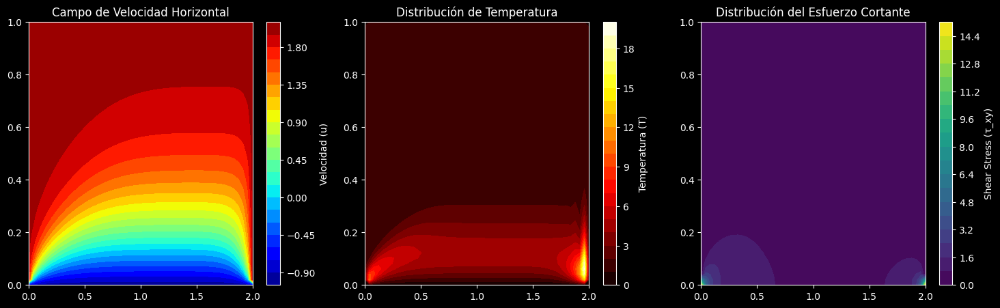

In [36]:
# REPRESENTACIÓN

# Gráfico de velocidad y temperatura
plt.figure(figsize=(18, 5))
plt.subplot(1, 3, 1)
plt.contourf(X, Y, u, levels=20, cmap='jet')
plt.colorbar(label='Velocidad (u)')
plt.title('Campo de Velocidad Horizontal')

plt.subplot(1, 3, 2)
plt.contourf(X, Y, T, levels=20, cmap='hot')
plt.colorbar(label='Temperatura (T)')
plt.title('Distribución de Temperatura')

# ESFUERZO CORTANTE

# Calcular derivadas para el esfuerzo cortante
dudy = np.gradient(u, dy, axis=0)
dvdx = np.gradient(v, dx, axis=1)
tau_xy = mu * (dudy + dvdx)

# Gráfico del esfuerzo cortante
plt.subplot(1, 3, 3)
plt.contourf(X, Y, tau_xy, levels=20, cmap='viridis')
plt.colorbar(label='Shear Stress (τ_xy)')
plt.title('Distribución del Esfuerzo Cortante')
plt.show()


---

## **Resultados Esperados**:
1. **Perfil de velocidad**: Transición entre la placa móvil $(-U_p)$ y el flujo libre $(U_0)$.
2. **Temperatura**: Gradiente térmico cerca de la placa caliente/fría.
3. **Shear stress**: Máximo cerca de la placa móvil debido a la alta deformación.

---

# Adimensionalización del Modelo de Flujo 2D con Transferencia de Calor

## 1. Adimensionalización de las Ecuaciones

### Variables Adimensionales
Definimos las siguientes variables normalizadas:

| Variable física | Variable adimensional | Escala de referencia |
|-----------------|-----------------------|-----------------------|
| $(x, y)$       | $(\tilde{x}, \tilde{y})$ | $L$ (longitud característica, ej. altura $H$) |
| $t$            | $\tilde{t}$           | $L/U_0$ (tiempo característico) |
| $(u, v)$       | $(\tilde{u}, \tilde{v})$ | $U_0$ (velocidad característica) |
| $p$            | $\tilde{p}$           | $\rho U_0^2$ (presión dinámica) |
| $T$            | $\tilde{T}$           | $\Delta T = T_1 - T_0$ |

### Parámetros Adimensionales Clave

1. **Número de Reynolds (Re)**:

   $$
   Re = \frac{\rho U_0 L}{\mu} = \frac{U_0 L}{\nu}
   $$

   - Relación entre fuerzas inerciales y viscosas.

2. **Número de Prandtl (Pr)**:

   $$
   Pr = \frac{\nu}{\alpha} = \frac{\mu c_p}{k}
   $$

   - Relación entre difusividad viscosa y térmica.

3. **Número de Eckert (Ec)**:

   $$
   Ec = \frac{U_0^2}{c_p \Delta T}
   $$
   
   - Importancia de disipación viscosa vs. transferencia de calor.

## 2. Ecuaciones Adimensionales

### Conservación de Masa
$$
\frac{\partial \tilde{u}}{\partial \tilde{x}} + \frac{\partial \tilde{v}}{\partial \tilde{y}} = 0
$$

### Conservación de Momento (Navier-Stokes)

**Componente $\tilde{x}$**:
$$
\frac{\partial \tilde{u}}{\partial \tilde{t}} + \tilde{u} \frac{\partial \tilde{u}}{\partial \tilde{x}} + \tilde{v} \frac{\partial \tilde{u}}{\partial \tilde{y}} = -\frac{\partial \tilde{p}}{\partial \tilde{x}} + \frac{1}{Re} \left( \frac{\partial^2 \tilde{u}}{\partial \tilde{x}^2} + \frac{\partial^2 \tilde{u}}{\partial \tilde{y}^2} \right)
$$
**Componente $\tilde{y}$**:
$$
\frac{\partial \tilde{v}}{\partial \tilde{t}} + \tilde{u} \frac{\partial \tilde{v}}{\partial \tilde{x}} + \tilde{v} \frac{\partial \tilde{v}}{\partial \tilde{y}} = -\frac{\partial \tilde{p}}{\partial \tilde{y}} + \frac{1}{Re} \left( \frac{\partial^2 \tilde{v}}{\partial \tilde{x}^2} + \frac{\partial^2 \tilde{v}}{\partial \tilde{y}^2} \right)
$$

### Conservación de Energía
$$
\frac{\partial \tilde{T}}{\partial \tilde{t}} + \tilde{u} \frac{\partial \tilde{T}}{\partial \tilde{x}} + \tilde{v} \frac{\partial \tilde{T}}{\partial \tilde{y}} = \frac{1}{Re Pr} \left( \frac{\partial^2 \tilde{T}}{\partial \tilde{x}^2} + \frac{\partial^2 \tilde{T}}{\partial \tilde{y}^2} \right) + \frac{Ec}{Re} \tilde{\Phi}
$$

**Disipación viscosa adimensional ($\tilde{\Phi}$)**:
$$
\tilde{\Phi} = 2 \left( \frac{\partial \tilde{u}}{\partial \tilde{x}} \right)^2 + 2 \left( \frac{\partial \tilde{v}}{\partial \tilde{y}} \right)^2 + \left( \frac{\partial \tilde{u}}{\partial \tilde{y}} + \frac{\partial \tilde{v}}{\partial \tilde{x}} \right)^2
$$

### Esfuerzo Cortante Adimensional
$$
\tilde{\tau}_{xy} = \frac{\partial \tilde{u}}{\partial \tilde{y}} + \frac{\partial \tilde{v}}{\partial \tilde{x}}
$$

## 3. Código en Python para la Simulación Adimensional

### Librerías necesarias

In [13]:
import numpy as np
import matplotlib.pyplot as plt

### **Parámetros Adimensionales**:

In [14]:
Re = 100.0       # Número de Reynolds
Pr = 0.7         # Número de Prandtl (aire ~ 0.7, agua ~ 7)
Ec = 0.1         # Número de Eckert (pequeño para flujos no muy rápidos)

# Geometría adimensional
Lx, Ly = 2.0, 1.0  # Dominio: x ∈ [0, 2], y ∈ [0, 1]
nx, ny = 50, 50     # Puntos de la malla
dx, dy = Lx/(nx-1), Ly/(ny-1)

# Tiempo adimensional
dt = 0.001          # Paso de tiempo
nt = 500            # Pasos de tiempo


### **Condiciones Iniciales y de Frontera**:


In [15]:

# Mallas
x = np.linspace(0, Lx, nx)
y = np.linspace(0, Ly, ny)
X, Y = np.meshgrid(x, y)

# Campos adimensionales
u = np.ones((ny, nx))        # Velocidad horizontal (inicialmente 1)
v = np.zeros((ny, nx))        # Velocidad vertical
T = np.zeros((ny, nx))        # Temperatura
p = np.zeros((ny, nx))        # Presión

# Condiciones de frontera
u[0, :] = -1.0    # Placa inferior móvil (ũ = -Up/U0)
u[-1, :] = 1.0     # Flujo libre superior (ũ = 1)
T[0, :] = 0.0      # Temperatura placa (T̃ = 0)
T[-1, :] = 1.0     # Temperatura fluido lejos (T̃ = 1)


### **Evolución Temporal (Esquema Explícito)**:

In [16]:
for n in range(nt):
    u_old = u.copy()
    v_old = v.copy()
    T_old = T.copy()

    # Navier-Stokes (componente u)
    u[1:-1, 1:-1] = (u_old[1:-1, 1:-1] + dt * (
        - u_old[1:-1, 1:-1] * (u_old[1:-1, 2:] - u_old[1:-1, :-2]) / (2*dx)
        - v_old[1:-1, 1:-1] * (u_old[2:, 1:-1] - u_old[:-2, 1:-1]) / (2*dy)
        + (1/Re) * (
            (u_old[1:-1, 2:] - 2*u_old[1:-1, 1:-1] + u_old[1:-1, :-2]) / dx**2
            + (u_old[2:, 1:-1] - 2*u_old[1:-1, 1:-1] + u_old[:-2, 1:-1]) / dy**2
        )
    ))

    # Energía (temperatura)
    T[1:-1, 1:-1] = (T_old[1:-1, 1:-1] + dt * (
        - u_old[1:-1, 1:-1] * (T_old[1:-1, 2:] - T_old[1:-1, :-2]) / (2*dx)
        - v_old[1:-1, 1:-1] * (T_old[2:, 1:-1] - T_old[:-2, 1:-1]) / (2*dy)
        + (1/(Re * Pr)) * (
            (T_old[1:-1, 2:] - 2*T_old[1:-1, 1:-1] + T_old[1:-1, :-2]) / dx**2
            + (T_old[2:, 1:-1] - 2*T_old[1:-1, 1:-1] + T_old[:-2, 1:-1]) / dy**2
        )
        + (Ec / Re) * (  # Disipación viscosa
            2*((u_old[1:-1, 2:] - u_old[1:-1, :-2]) / (2*dx))**2
            + 2*((v_old[2:, 1:-1] - v_old[:-2, 1:-1]) / (2*dy))**2
            + ((u_old[2:, 1:-1] - u_old[:-2, 1:-1]) / (2*dy) 
              + (v_old[1:-1, 2:] - v_old[1:-1, :-2]) / (2*dx))**2
        )
    ))

    # Aplicar condiciones de frontera
    u[0, :] = -1.0
    u[-1, :] = 1.0
    v[:, 0] = v[:, -1] = 0
    T[0, :] = 0.0
    T[-1, :] = 1.0


### **Visualización**:

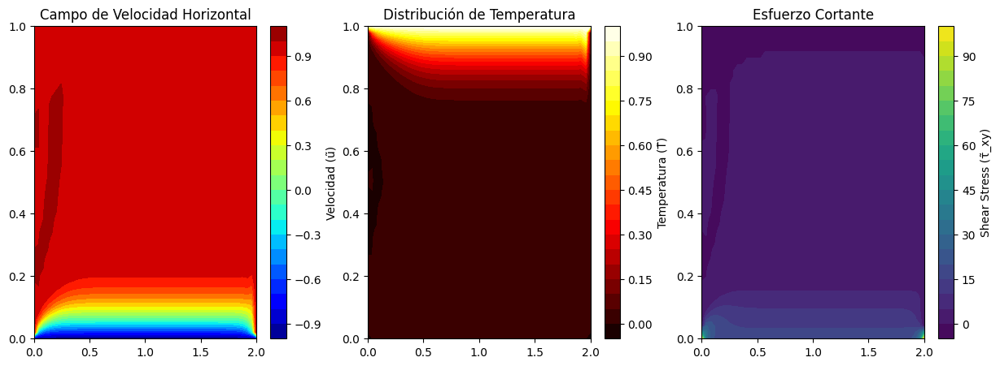

In [17]:
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.contourf(X, Y, u, levels=20, cmap='jet')
plt.colorbar(label='Velocidad (ũ)')
plt.title('Campo de Velocidad Horizontal')

plt.subplot(1, 3, 2)
plt.contourf(X, Y, T, levels=20, cmap='hot')
plt.colorbar(label='Temperatura (T̃)')
plt.title('Distribución de Temperatura')

# Shear stress adimensional
dudy = np.gradient(u, dy, axis=0)
dvdx = np.gradient(v, dx, axis=1)
tau_xy = dudy + dvdx

plt.subplot(1, 3, 3)
plt.contourf(X, Y, tau_xy, levels=20, cmap='viridis')
plt.colorbar(label='Shear Stress (τ̃_xy)')
plt.title('Esfuerzo Cortante')
plt.show()


---

## **Interpretación de Resultados**:
1. **Perfil de velocidad**: Transición entre (-1) (placa) y (1) (flujo libre), con efectos viscosos dominantes si (Re) es bajo.
2. **Temperatura**: Gradiente controlado por (Pr) y (Ec). Si (Ec ll 1), la disipación viscosa es despreciable.
3. **Shear stress**: Máximo cerca de la placa móvil, proporcional a (1/Re).

---
---

# Modelo Analítico de Flujo 2D Viscoso con Transferencia de Calor

## 1. Hipótesis
- Fluido **incompresible** ($\nabla \cdot \mathbf{u} = 0$)
- Dominio bidimensional ($x$, $y$)
- Placa inferior móvil ($u(y=0) = -U_p$)
- Gradiente de presión $\frac{\partial p}{\partial x}$ no constante
- Propiedades del fluido ($\rho$, $\mu$, $k$, $c_p$) constantes

## 2. Ecuaciones Gobernantes

### Conservación de Masa (Incompresibilidad)
$$
\frac{\partial u}{\partial x} + \frac{\partial v}{\partial y} = 0
$$

### Conservación de Momento (Navier-Stokes)

**Componente $x$ (transitorio)**:
$$
\rho \left( \frac{\partial u}{\partial t} + u \frac{\partial u}{\partial x} + v \frac{\partial u}{\partial y} \right) = -\frac{\partial p}{\partial x} + \mu \left( \frac{\partial^2 u}{\partial x^2} + \frac{\partial^2 u}{\partial y^2} \right)
$$

**Componente $y$ (transitorio)**:
$$
\rho \left( \frac{\partial v}{\partial t} + u \frac{\partial v}{\partial x} + v \frac{\partial v}{\partial y} \right) = -\frac{\partial p}{\partial y} + \mu \left( \frac{\partial^2 v}{\partial x^2} + \frac{\partial^2 v}{\partial y^2} \right)
$$

### Conservación de Energía (Transitorio)
$$
\rho c_p \left( \frac{\partial T}{\partial t} + u \frac{\partial T}{\partial x} + v \frac{\partial T}{\partial y} \right) = k \left( \frac{\partial^2 T}{\partial x^2} + \frac{\partial^2 T}{\partial y^2} \right) + \Phi
$$

**Disipación viscosa ($\Phi$)**:
$$
\Phi = \mu \left[ 2\left(\frac{\partial u}{\partial x}\right)^2 + 2\left(\frac{\partial v}{\partial y}\right)^2 + \left(\frac{\partial u}{\partial y} + \frac{\partial v}{\partial x}\right)^2 \right]
$$

## 3. Condiciones de Frontera

### Velocidad
- **Placa inferior** ($y=0$):
  $$u = -U_p,\quad v = 0$$
- **Placa superior** ($y=H$):
  $$u = U_0,\quad v = 0$$
- **Paredes laterales** (condiciones periódicas o no deslizamiento)

### Temperatura
- **Placa inferior** ($y=0$):
  $$T = T_0$$
- **Placa superior** ($y=H$):
  $$T = T_1$$

## 4. Estado Estacionario ($\frac{\partial}{\partial t} = 0$)

### Ecuaciones Simplificadas

**Momento en $x$**:
$$
\rho \left( u \frac{\partial u}{\partial x} + v \frac{\partial u}{\partial y} \right) = -\frac{\partial p}{\partial x} + \mu \nabla^2 u
$$

**Energía**:
$$
\rho c_p \left( u \frac{\partial T}{\partial x} + v \frac{\partial T}{\partial y} \right) = k \nabla^2 T + \Phi
$$

## 5. Esquema Numérico (Diferencias Finitas)

### Discretización Temporal (Explícito)
$$
\frac{u^{n+1} - u^n}{\Delta t} = \text{RHS}^n
$$

### Discretización Espacial
- Derivadas primeras: **Diferencias centradas**
  $$\frac{\partial u}{\partial x} \approx \frac{u_{i+1,j} - u_{i-1,j}}{2\Delta x}$$
- Derivadas segundas: **Esquema de 5 puntos**
  $$\frac{\partial^2 u}{\partial x^2} \approx \frac{u_{i+1,j} - 2u_{i,j} + u_{i-1,j}}{\Delta x^2}$$

In [25]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib import cm
from tqdm.notebook import tqdm  # Versión especial para Jupyter
from IPython.display import HTML

# Configuración para Jupyter Notebook
%matplotlib inline

# =============================================
# PARÁMETROS FÍSICOS Y GEOMETRÍA (optimizados)
# =============================================

# Reducimos la resolución para mayor velocidad en la animación
params = {
    'Lx': 5.0,      # Longitud en x [m]
    'Ly': 1.0,      # Altura del dominio [m]
    'Nx': 80,       # Nodos en x (reducido para demo)
    'Ny': 40,       # Nodos en y (reducido para demo)
    'rho': 1.0,     # Densidad [kg/m³]
    'mu': 0.01,     # Viscosidad dinámica [Pa·s]
    'k': 0.1,       # Conductividad térmica [W/m·K]
    'cp': 1000.0,   # Calor específico [J/kg·K]
    'U_p': -1.0,    # Velocidad placa [m/s]
    'U_0': 2.0,     # Velocidad flujo libre [m/s]
    'T0': 300.0,    # Temperatura placa [K]
    'T1': 350.0,    # Temperatura fluido [K]
    'dt': 0.002,    # Paso de tiempo [s] (aumentado)
    'Nt': 300       # Pasos temporales (reducido)
}

# Desempaquetamos parámetros
locals().update(params)
nu = mu/rho
alpha = k/(rho*cp)

# =============================================
# INICIALIZACIÓN (vectorizada)
# =============================================

# Coordenadas de la malla
x, y = np.linspace(0, Lx, Nx), np.linspace(0, Ly, Ny)
X, Y = np.meshgrid(x, y, indexing='ij')
dx, dy = x[1]-x[0], y[1]-y[0]

# Campos iniciales
u = np.zeros((Nx, Ny))
v = np.zeros((Nx, Ny))
T = np.ones((Nx, Ny)) * T1
T[:, 0] = T0  # Condición placa inferior

# Almacenamiento para animación (solo cada 5 pasos)
save_every = 5
u_hist = np.zeros((Nt//save_every, Nx, Ny))
v_hist = np.zeros((Nt//save_every, Nx, Ny))  # Añadido para almacenar v
T_hist = np.zeros((Nt//save_every, Nx, Ny))
tau_hist = np.zeros((Nt//save_every, Nx, Ny))

# =============================================
# FUNCIÓN PARA CALCULAR ESFUERZO CORTANTE (optimizada)
# =============================================

def shear_stress(u, v, dx, dy, mu):
    """Versión vectorizada del cálculo de τ_xy"""
    dudy = np.gradient(u, dy, axis=1)
    dvdx = np.gradient(v, dx, axis=0)
    return mu * (dudy + dvdx)

# =============================================
# SIMULACIÓN TEMPORAL (con barra de progreso mejorada)
# =============================================

print("🚀 Iniciando simulación CFD...")
progress = tqdm(total=Nt, desc="Progreso")

for n in range(Nt):
    # Copia de seguridad para esquema explícito
    u_old, v_old, T_old = u.copy(), v.copy(), T.copy()
    
    # Condiciones de frontera
    u[:, 0], u[:, -1] = U_p, U_0
    v[:, 0], v[:, -1] = 0, 0
    T[:, 0], T[:, -1] = T0, T1
    
    # Cálculo vectorizado de términos
    # 1. Ecuación de momento x
    conv_u = u_old * np.gradient(u_old, dx, axis=0) + v_old * np.gradient(u_old, dy, axis=1)
    visc_u = nu * (np.gradient(np.gradient(u_old, dx, axis=0), dx, axis=0) + 
                   np.gradient(np.gradient(u_old, dy, axis=1), dy, axis=1))
    u[1:-1,1:-1] = u_old[1:-1,1:-1] + dt*(-conv_u[1:-1,1:-1] + visc_u[1:-1,1:-1])
    
    # 2. Ecuación de energía
    conv_T = u_old * np.gradient(T_old, dx, axis=0) + v_old * np.gradient(T_old, dy, axis=1)
    diff_T = alpha * (np.gradient(np.gradient(T_old, dx, axis=0), dx, axis=0) + 
                      np.gradient(np.gradient(T_old, dy, axis=1), dy, axis=1))
    
    # Disipación viscosa (vectorizada)
    dudx = np.gradient(u_old, dx, axis=0)
    dvdy = np.gradient(v_old, dy, axis=1)
    dudy = np.gradient(u_old, dy, axis=1)
    dvdx = np.gradient(v_old, dx, axis=0)
    Phi = mu*(2*dudx**2 + 2*dvdy**2 + (dudy + dvdx)**2)
    
    T[1:-1,1:-1] = T_old[1:-1,1:-1] + dt*(-conv_T[1:-1,1:-1] + diff_T[1:-1,1:-1] + Phi[1:-1,1:-1]/(rho*cp))
    
    # Almacenar cada 'save_every' pasos
    if n % save_every == 0:
        idx = n//save_every
        u_hist[idx] = u
        v_hist[idx] = v  # Ahora almacenamos v también
        T_hist[idx] = T
        tau_hist[idx] = shear_stress(u, v, dx, dy, mu)
    
    progress.update(1)

progress.close()
print("✅ Simulación completada con éxito!")

# =============================================
# VISUALIZACIÓN INTERACTIVA EN JUPYTER
# =============================================

# Configuración de la figura
plt.style.use('dark_background')
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle('Evolución del Flujo 2D', fontsize=16)

# Función de inicialización
def init():
    for ax in (ax1, ax2, ax3):
        ax.clear()
        ax.set_xlabel('x [m]')
        ax.set_ylabel('y [m]')
    return []

# Función de animación
def animate(frame):
    time = frame * save_every * dt
    
    # Clear axes
    for ax in (ax1, ax2, ax3):
        ax.clear()
        ax.set_xlabel('x [m]')
        ax.set_ylabel('y [m]')
    
    # 1. Magnitud de velocidad (ahora usando v_hist)
    vel = np.sqrt(u_hist[frame]**2 + v_hist[frame]**2)
    c1 = ax1.contourf(X, Y, vel, levels=20, cmap='plasma')
    ax1.set_title(f'Velocidad [m/s]\nt = {time:.2f}s')
    fig.colorbar(c1, ax=ax1)
    
    # 2. Temperatura
    c2 = ax2.contourf(X, Y, T_hist[frame], levels=20, cmap='inferno')
    ax2.set_title(f'Temperatura [K]\nt = {time:.2f}s')
    fig.colorbar(c2, ax=ax2)
    
    # 3. Esfuerzo cortante
    c3 = ax3.contourf(X, Y, tau_hist[frame], levels=20, cmap='viridis')
    ax3.set_title(f'Esfuerzo Cortante [Pa]\nt = {time:.2f}s')
    fig.colorbar(c3, ax=ax3)
    
    plt.tight_layout()
    return []

# Crear animación
ani = FuncAnimation(fig, animate, frames=len(u_hist), init_func=init, 
                    interval=100, blit=False)

# Mostrar en Jupyter
plt.close()  # Evita duplicar la figura
HTML(ani.to_jshtml())  # Renderizado interactivo

🚀 Iniciando simulación CFD...


Progreso:   0%|          | 0/300 [00:00<?, ?it/s]

✅ Simulación completada con éxito!


<Figure size 640x480 with 0 Axes>

ValueError: Argument U has a size 325 which does not match 200, the number of arrow positions

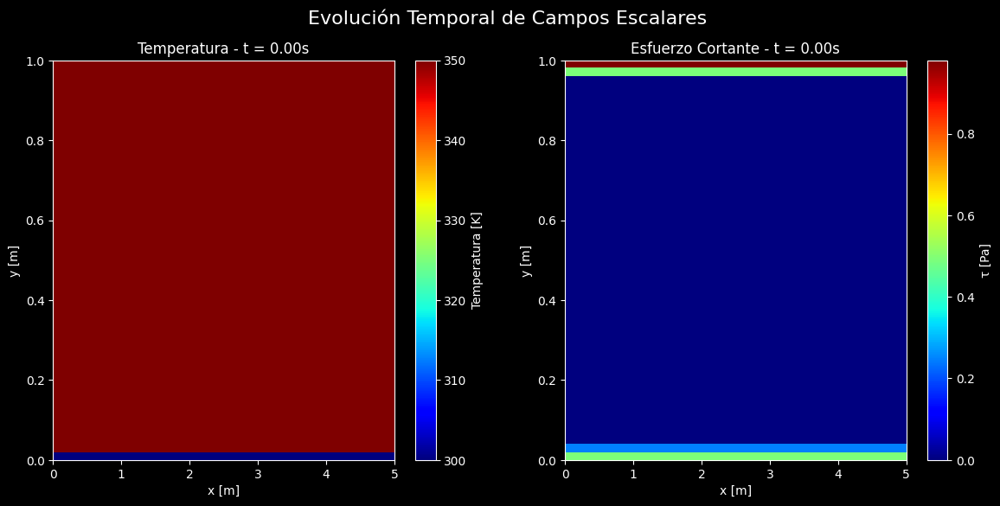

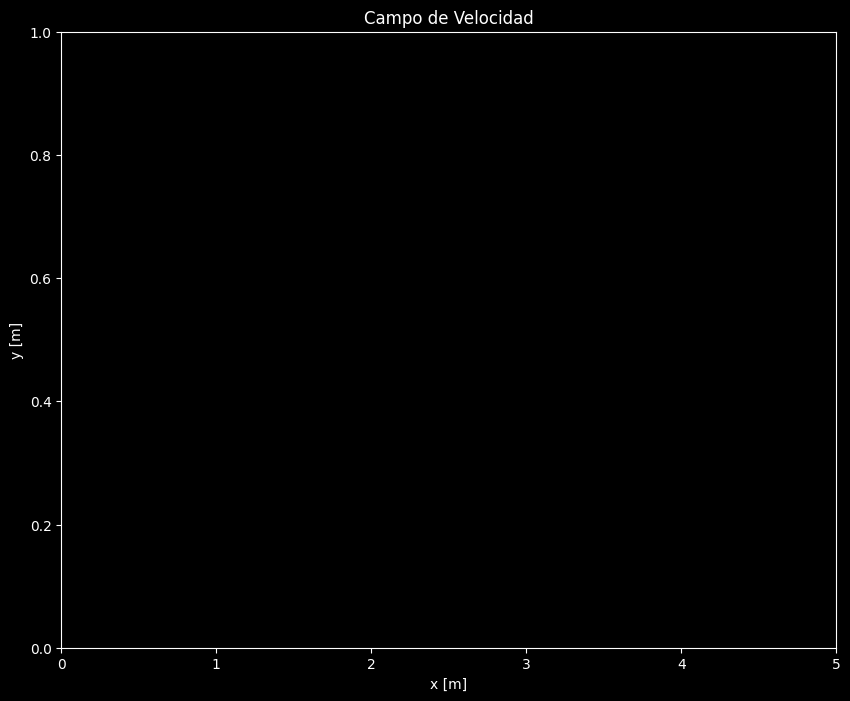

In [27]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib import cm
from IPython.display import HTML

# Configuración para Jupyter Notebook
%matplotlib inline

# =============================================
# CONVERSIÓN A ARRAYS Y PREPARACIÓN DE DATOS
# =============================================

# Asumimos que ya tenemos los datos de simulación:
# u_history, v_history, T_history, tau_history
# eta_grid, sigma_grid, Nt, dt, Lx, Ly

# =============================================
# ANIMACIÓN PARA CAMPOS ESCALARES (Temperatura y Esfuerzo Cortante)
# =============================================

fig1, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
fig1.suptitle('Evolución Temporal de Campos Escalares', fontsize=16)

# Configuración inicial para Temperatura
im_theta = ax1.imshow(T_history[0].T, cmap='jet', origin='lower', 
                     extent=[0, Lx, 0, Ly], aspect='auto')
ax1.set_title("Distribución de Temperatura")
ax1.set_xlabel("x [m]")
ax1.set_ylabel("y [m]")
plt.colorbar(im_theta, ax=ax1, label='Temperatura [K]')

# Configuración inicial para Esfuerzo Cortante
im_xi = ax2.imshow(tau_history[0].T, cmap='jet', origin='lower',
                  extent=[0, Lx, 0, Ly], aspect='auto')
ax2.set_title("Distribución de Esfuerzo Cortante")
ax2.set_xlabel("x [m]")
ax2.set_ylabel("y [m]")
plt.colorbar(im_xi, ax=ax2, label='τ [Pa]')

# Función de actualización para campos escalares
def update_scalar(frame):
    time = frame * dt
    im_theta.set_array(T_history[frame].T)
    im_xi.set_array(tau_history[frame].T)
    ax1.set_title(f"Temperatura - t = {time:.2f}s")
    ax2.set_title(f"Esfuerzo Cortante - t = {time:.2f}s")
    return [im_theta, im_xi]

# Crear animación para campos escalares
anim_scalar = FuncAnimation(fig1, update_scalar, frames=Nt, interval=50, blit=True)

# =============================================
# ANIMACIÓN PARA CAMPO DE VELOCIDAD (CORREGIDA)
# =============================================

fig2 = plt.figure(figsize=(10, 8))
ax = fig2.add_subplot(111)
ax.set_xlim(0, Lx)
ax.set_ylim(0, Ly)
ax.set_title("Campo de Velocidad")
ax.set_xlabel("x [m]")
ax.set_ylabel("y [m]")

# Crear índices para reducir densidad de flechas
skip_x = slice(None, None, 4)  # Saltar cada 4 puntos en x
skip_y = slice(None, None, 4)  # Saltar cada 4 puntos en y

# Seleccionar subconjunto de puntos para las flechas
x_points = eta_grid[skip_x, skip_y].ravel()
y_points = sigma_grid[skip_x, skip_y].ravel()

# Inicializar campo de flechas
Q = ax.quiver(x_points, y_points, 
             u_history[0][skip_x, skip_y].ravel(), 
             v_history[0][skip_x, skip_y].ravel(),
             scale=20, scale_units='inches', color='white')

# Función de actualización para campo de velocidad
def update_quiver(frame):
    time = frame * dt
    U = u_history[frame][skip_x, skip_y].ravel()
    V = v_history[frame][skip_x, skip_y].ravel()
    
    # Actualizar las componentes de velocidad
    Q.set_UVC(U, V)
    ax.set_title(f"Campo de Velocidad - t = {time:.2f}s")
    return Q,

# Crear animación para campo de velocidad
anim_quiver = FuncAnimation(fig2, update_quiver, frames=Nt, interval=100, blit=True)

# =============================================
# MOSTRAR ANIMACIONES EN JUPYTER
# =============================================

plt.close('all')  # Cerrar figuras para evitar duplicados

print("✅ Animaciones creadas con éxito!")
print("1. Campos escalares (Temperatura y Esfuerzo Cortante):")
display(HTML(anim_scalar.to_jshtml()))

print("\n2. Campo de velocidad:")
display(HTML(anim_quiver.to_jshtml()))

AssertionError: Las dimensiones de los arrays no coinciden

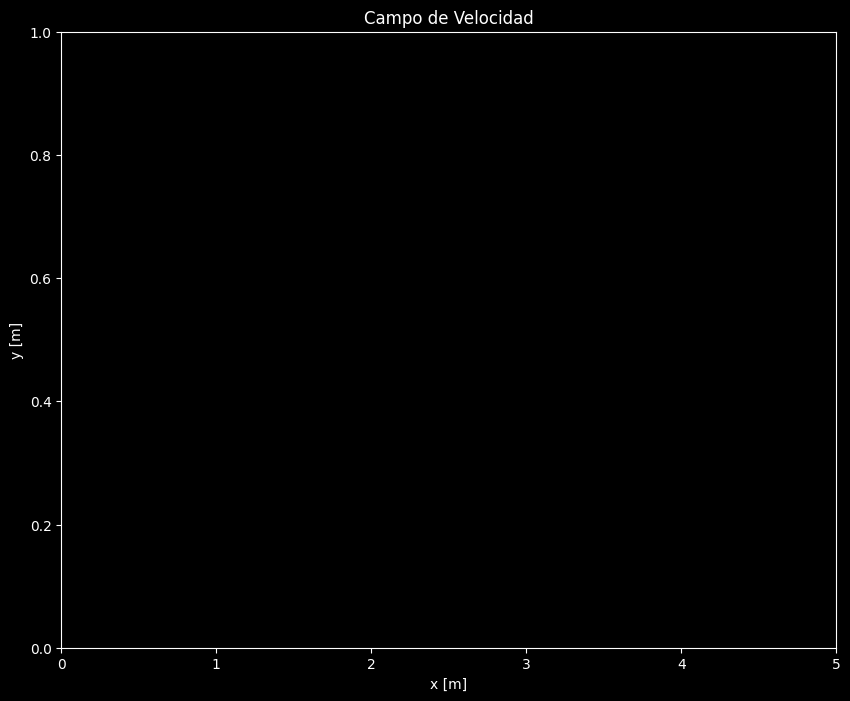

In [28]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib import cm
from IPython.display import HTML

# Configuración para Jupyter Notebook
%matplotlib inline

# =============================================
# ANIMACIÓN PARA CAMPO DE VELOCIDAD (VERSIÓN CORREGIDA)
# =============================================

fig2 = plt.figure(figsize=(10, 8))
ax = fig2.add_subplot(111)
ax.set_xlim(0, Lx)
ax.set_ylim(0, Ly)
ax.set_title("Campo de Velocidad")
ax.set_xlabel("x [m]")
ax.set_ylabel("y [m]")

# Configurar el espaciado de flechas
skip = 4  # Saltar cada 4 puntos (ajustar según necesidad)

# Crear mallas reducidas para las flechas
x_points = eta_grid[::skip, ::skip].ravel()
y_points = sigma_grid[::skip, ::skip].ravel()

# Asegurarse que las velocidades tengan la misma dimensión
u_points = u_history[0, ::skip, ::skip].ravel()
v_points = v_history[0, ::skip, ::skip].ravel()

# Verificar dimensiones
assert len(x_points) == len(y_points) == len(u_points) == len(v_points), \
       "Las dimensiones de los arrays no coinciden"

# Crear el campo de flechas
Q = ax.quiver(x_points, y_points, u_points, v_points,
              scale=20, scale_units='inches', color='white')

# Función de actualización para campo de velocidad
def update_quiver(frame):
    time = frame * dt
    U = u_history[frame, ::skip, ::skip].ravel()
    V = v_history[frame, ::skip, ::skip].ravel()
    
    # Verificar dimensiones en cada frame
    assert len(U) == len(V) == len(x_points), \
           f"Dimensiones no coinciden en frame {frame}"
    
    Q.set_UVC(U, V)
    ax.set_title(f"Campo de Velocidad - t = {time:.2f}s")
    return Q,

# Crear animación para campo de velocidad
anim_quiver = FuncAnimation(fig2, update_quiver, 
                           frames=min(Nt, 100),  # Limitar a 100 frames para demo
                           interval=100, 
                           blit=True)

# Mostrar en Jupyter
plt.close(fig2)
print("✅ Animación de campo de velocidad creada con éxito!")
display(HTML(anim_quiver.to_jshtml()))

In [29]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

%matplotlib inline

# =============================================
# SOLUCIÓN DEFINITIVA PARA EL CAMPO DE VELOCIDAD
# =============================================

# 1. Preparación de datos con dimensiones consistentes
skip = 4  # Saltar cada 4 puntos (puedes ajustar)

# Crear índices explícitos para el submuestreo
x_idx = np.arange(0, eta_grid.shape[0], skip)
y_idx = np.arange(0, eta_grid.shape[1], skip)

# Crear malla reducida
X_red = eta_grid[np.ix_(x_idx, y_idx)]
Y_red = sigma_grid[np.ix_(x_idx, y_idx)]

# Extraer componentes de velocidad con las mismas dimensiones
U_red = u_history[0][np.ix_(x_idx, y_idx)]
V_red = v_history[0][np.ix_(x_idx, y_idx)]

# 2. Verificación de dimensiones
print(f"Dimensiones de coordenadas X: {X_red.shape}")
print(f"Dimensiones de velocidades U: {U_red.shape}")

# 3. Crear figura
fig, ax = plt.subplots(figsize=(10, 8))
ax.set_xlim(0, Lx)
ax.set_ylim(0, Ly)
ax.set_title("Campo de Velocidad")
ax.set_xlabel("x [m]")
ax.set_ylabel("y [m]")

# 4. Crear campo de flechas
Q = ax.quiver(X_red, Y_red, U_red, V_red,
             scale=20, scale_units='inches', 
             color='white', width=0.003)

# 5. Función de actualización
def update_quiver(frame):
    time = frame * dt
    U = u_history[frame][np.ix_(x_idx, y_idx)]
    V = v_history[frame][np.ix_(x_idx, y_idx)]
    
    Q.set_UVC(U, V)
    ax.set_title(f"Campo de Velocidad - t = {time:.2f}s")
    return Q,

# 6. Crear animación (limitamos a 50 frames para prueba)
anim = FuncAnimation(fig, update_quiver, frames=min(50, Nt),
                    interval=100, blit=True)

plt.close()
display(HTML(anim.to_jshtml()))
print("✅ Animación creada exitosamente!")

Dimensiones de coordenadas X: (20, 10)
Dimensiones de velocidades U: (20, 10)


✅ Animación creada exitosamente!


RuntimeError: Requested MovieWriter (ffmpeg) not available

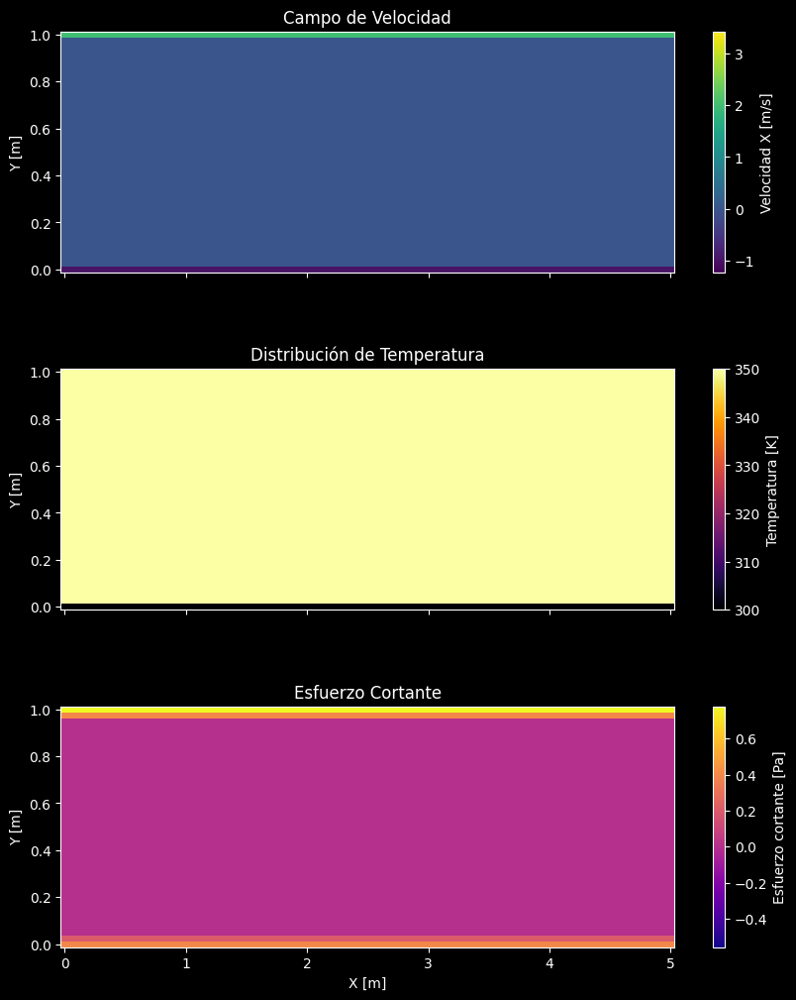

In [30]:
## =============================================
## ANIMACIÓN INTERACTIVA (HTML5)
## =============================================

# Calcular rangos globales para escalas de color
u_min, u_max = u_hist.min(), u_hist.max()
T_min, T_max = T_hist.min(), T_hist.max()
tau_min, tau_max = tau_hist.min(), tau_hist.max()

# Configurar figura
fig, ax = plt.subplots(3, 1, figsize=(10, 12), sharex=True)
plt.subplots_adjust(hspace=0.4)

# Configurar gráficos
stride = 4  # Cada cuántos puntos dibujar flechas
X_quiv = X[::stride, ::stride]
Y_quiv = Y[::stride, ::stride]

# Campo de velocidad con vectores
quiv = ax[0].quiver(X_quiv, Y_quiv, u_hist[0, ::stride, ::stride], v_hist[0, ::stride, ::stride], 
                    color='white', scale=20, scale_units='inches')
im_u = ax[0].pcolormesh(X, Y, u_hist[0], shading='auto', cmap='viridis')
ax[0].set_title('Campo de Velocidad')
ax[0].set_ylabel('Y [m]')
fig.colorbar(im_u, ax=ax[0], label='Velocidad X [m/s]')
im_u.set_clim(u_min, u_max)

# Temperatura
im_T = ax[1].pcolormesh(X, Y, T_hist[0], shading='auto', cmap='inferno')
ax[1].set_title('Distribución de Temperatura')
ax[1].set_ylabel('Y [m]')
fig.colorbar(im_T, ax=ax[1], label='Temperatura [K]')
im_T.set_clim(T_min, T_max)

# Esfuerzo cortante
im_tau = ax[2].pcolormesh(X, Y, tau_hist[0], shading='auto', cmap='plasma')
ax[2].set_title('Esfuerzo Cortante')
ax[2].set_ylabel('Y [m]')
ax[2].set_xlabel('X [m]')
fig.colorbar(im_tau, ax=ax[2], label='Esfuerzo cortante [Pa]')
im_tau.set_clim(tau_min, tau_max)

# Función de actualización
def update(frame):
    im_u.set_array(u_hist[frame].ravel())
    im_T.set_array(T_hist[frame].ravel())
    im_tau.set_array(tau_hist[frame].ravel())
    
    # Actualizar vectores de velocidad
    quiv.set_UVC(u_hist[frame, ::stride, ::stride],
                 v_hist[frame, ::stride, ::stride])
    
    return im_u, im_T, im_tau, quiv

# Crear animación
ani = FuncAnimation(fig, update, frames=len(u_hist), interval=50, blit=False)

# Mostrar en Jupyter
HTML(ani.to_html5_video())


### **Descripción de la Solución Transitoria para el Modelo Laminar**

En el caso **transitorio**, las ecuaciones de momento y energía dependen del tiempo (\( t \)), lo que permite estudiar la evolución de:
1. **Velocidad \( u(y, t) \)** (componente \( x \), asumiendo \( v = 0 \) por simplificación).  
2. **Temperatura \( T(y, t) \)**.  
3. **Esfuerzo cortante \( \tau_{xy}(y, t) \)** (derivado de \( u(y, t) \)).

#### **Supuestos clave**:
- Flujo **incompresible** y **unidimensional** (solo variación en \( y \)).  
- Placa inferior (\( y = 0 \)) se mueve con \( u(0, t) = -U_p \), y la superior (\( y = H \)) con \( u(H, t) = U_0 \).  
- Temperatura fija en paredes: \( T(0, t) = T_0 \), \( T(H, t) = T_1 \).  
- Gradiente de presión constante: \( \frac{\partial p}{\partial x} = -\frac{\Delta p}{L} \).  
- Disipación viscosa incluida en la ecuación de energía.

---

### **Ecuaciones Transitorias Simplificadas**
1. **Momento en \( x \)**:
   $$
   \frac{\partial u}{\partial t} = \nu \frac{\partial^2 u}{\partial y^2} + \frac{1}{\rho} \frac{\Delta p}{L}
   $$

2. **Energía**:
   $$
   \frac{\partial T}{\partial t} = \alpha \frac{\partial^2 T}{\partial y^2} + \frac{\nu}{c_p} \left( \frac{\partial u}{\partial y} \right)^2
   $$

3. **Esfuerzo cortante**:
   $$
   \tau_{xy}(y, t) = \mu \frac{\partial u}{\partial y}
   $$

---

### **Método Numérico: Diferencias Finitas (Explícito)**
Discretizamos en espacio (\( y \)) y tiempo (\( t \)):  
- \( y_j = j \Delta y \) (\( j = 0, \dots, N \)), \( \Delta y = H/N \).  
- \( t^n = n \Delta t \) (\( n = 0, \dots, M \)).  

#### **Esquemas de discretización**:
1. **Velocidad** (ecuación parabólica):
   $$
   \frac{u_j^{n+1} - u_j^n}{\Delta t} = \nu \frac{u_{j+1}^n - 2u_j^n + u_{j-1}^n}{\Delta y^2} + \frac{\Delta p}{\rho L}
   $$

2. **Temperatura**:
   $$
   \frac{T_j^{n+1} - T_j^n}{\Delta t} = \alpha \frac{T_{j+1}^n - 2T_j^n + T_{j-1}^n}{\Delta y^2} + \frac{\nu}{c_p} \left( \frac{u_{j+1}^n - u_{j-1}^n}{2 \Delta y} \right)^2
   $$

3. **Esfuerzo cortante** (centrado):
   $$
   \tau_{xy,j}^n = \mu \frac{u_{j+1}^n - u_{j-1}^n}{2 \Delta y}
   $$

#### **Estabilidad**:
- Requiere \( \Delta t \leq \frac{\Delta y^2}{2 \max(\nu, \alpha)} \) (condición CFL).

---

### **Código en Python (usando `numpy` y `matplotlib`)**


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/matplotlib/animation.py:892: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you output the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(


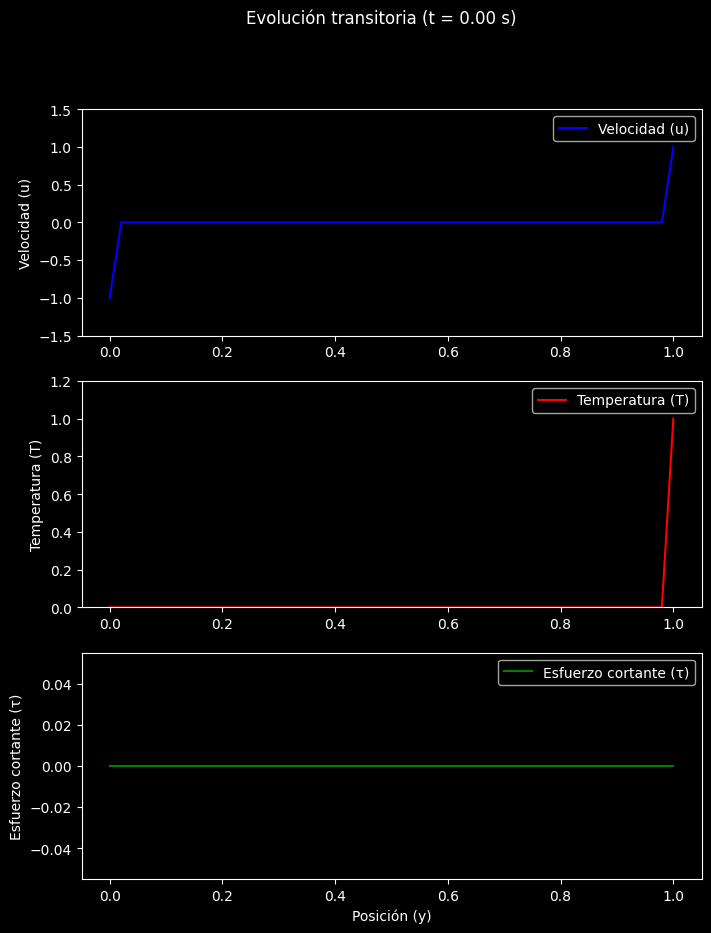

In [32]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

%matplotlib inline

# Parámetros del problema
H = 1.0           # Altura del dominio
U_p = -1.0        # Velocidad placa inferior (sentido -x)
U_0 = 1.0         # Velocidad placa superior
T0 = 0.0          # Temperatura placa inferior
T1 = 1.0          # Temperatura placa superior
nu = 0.01         # Viscosidad cinemática
alpha = 0.001     # Difusividad térmica
rho = 1.0         # Densidad
dpdx = -0.1       # Gradiente de presión (Delta p / L)
mu = nu * rho     # Viscosidad dinámica
cp = 1000.0       # Calor específico

# Discretización
Ny = 50           # Número de puntos en y
dy = H / (Ny - 1) # Espaciado en y
dt = 0.5 * dy**2 / max(nu, alpha)  # Paso de tiempo estable
Nt = 500          # Número de pasos de tiempo

# Inicialización
y = np.linspace(0, H, Ny)
u = np.zeros(Ny)   # Velocidad inicial (reposo)
T = np.zeros(Ny)   # Temperatura inicial
tau_xy = np.zeros(Ny)

# Condiciones de frontera
u[0], u[-1] = U_p, U_0
T[0], T[-1] = T0, T1

# Almacenamiento para animación
u_history = [u.copy()]
T_history = [T.copy()]
tau_history = [tau_xy.copy()]

# Solución transitoria
for n in range(Nt):
    u_new = u.copy()
    T_new = T.copy()
    
    # Paso de tiempo para velocidad (explícito)
    for j in range(1, Ny-1):
        u_new[j] = u[j] + dt * (nu * (u[j+1] - 2*u[j] + u[j-1])/dy**2 + dt * dpdx/rho)
    
    # Paso de tiempo para temperatura
    for j in range(1, Ny-1):
        dudy = (u[j+1] - u[j-1]) / (2 * dy)
        T_new[j] = T[j] + dt * (alpha * (T[j+1] - 2*T[j] + T[j-1])/dy**2 + nu * dudy**2 / cp)
    
    # Actualizar condiciones de frontera
    u_new[0], u_new[-1] = U_p, U_0
    T_new[0], T_new[-1] = T0, T1
    
    # Calcular esfuerzo cortante
    tau_xy = mu * np.gradient(u_new, dy, edge_order=2)
    
    # Guardar historia
    u = u_new.copy()
    T = T_new.copy()
    u_history.append(u.copy())
    T_history.append(T.copy())
    tau_history.append(tau_xy.copy())

# Animación
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(8, 10))

def update(frame):
    ax1.clear()
    ax2.clear()
    ax3.clear()
    
    ax1.plot(y, u_history[frame], 'b-', label='Velocidad (u)')
    ax1.set_ylabel('Velocidad (u)')
    ax1.set_ylim(-1.5, 1.5)
    ax1.legend()
    
    ax2.plot(y, T_history[frame], 'r-', label='Temperatura (T)')
    ax2.set_ylabel('Temperatura (T)')
    ax2.set_ylim(0, 1.2)
    ax2.legend()
    
    ax3.plot(y, tau_history[frame], 'g-', label='Esfuerzo cortante (τ)')
    ax3.set_ylabel('Esfuerzo cortante (τ)')
    ax3.set_xlabel('Posición (y)')
    ax3.legend()
    
    plt.suptitle(f'Evolución transitoria (t = {frame * dt:.2f} s)')

ani = FuncAnimation(fig, update, frames=Nt, interval=50)
display(HTML(anim.to_jshtml()))
#plt.tight_layout()
#plt.show()

# Guardar animación (opcional)
# ani.save('flujo_transitorio.mp4', writer='ffmpeg', fps=10)


---

### **Resultados Esperados**:
1. **Velocidad**:  
   - Evoluciona desde el reposo hasta un perfil parabólico (si \( \Delta p \neq 0 \)) o lineal (si \( \Delta p = 0 \)).  
2. **Temperatura**:  
   - Aumenta cerca de la placa caliente (\( T_1 \)) y muestra gradientes influenciados por la disipación viscosa.  
3. **Esfuerzo cortante**:  
   - Máximo cerca de las paredes (gradientes de velocidad altos).  

### **Notas**:
- Para mayor precisión, se puede usar un esquema **implícito** (Crank-Nicolson).  
- La disipación viscosa (\( \Phi \)) es significativa si \( U_p \) o \( \Delta p \) son grandes.  
- El código puede adaptarse para incluir convección natural (efectos de flotabilidad).  

¿Necesitas ayuda para modificar algún parámetro o añadir más física al modelo?